In [1]:
import fxcmpy
import numpy as np
import pandas as pd
import datetime as dt
import cufflinks as cf
import warnings; warnings.simplefilter('ignore')
from statsmodels.tsa.stattools import adfuller
cf.set_config_file(offline=True)

In [2]:
import fxcmpy
con = fxcmpy.fxcmpy(config_file='fxcm.cfg')

In [3]:
candles = con.get_candles('US30', period='m1',start= dt.datetime(2019, 7, 16),end = dt.datetime(2019, 7, 19))


In [4]:
candles

,bidopen,bidclose,bidhigh,bidlow,askopen,askclose,askhigh,asklow,tickqty
date,,,,,,,,,
2019-07-16 00:00:00,27374.4,27373.1,27374.4,27368.9,27375.9,27374.8,27378.1,27371.4,572
2019-07-16 00:01:00,27373.0,27369.6,27373.0,27366.6,27374.7,27371.4,27374.7,27368.7,456
2019-07-16 00:02:00,27369.6,27372.2,27373.1,27368.6,27371.5,27373.5,27375.1,27370.7,303
2019-07-16 00:03:00,27372.2,27371.2,27372.5,27368.9,27373.5,27372.4,27375.1,27370.9,284
2019-07-16 00:04:00,27371.2,27371.3,27372.1,27368.9,27372.4,27372.6,27375.1,27371.1,212
2019-07-16 00:05:00,27371.3,27369.1,27371.3,27365.9,27372.6,27370.4,27373.0,27367.9,251
2019-07-16 00:06:00,27369.1,27368.8,27371.1,27365.9,27370.4,27370.3,27375.1,27369.6,327
2019-07-16 00:07:00,27368.8,27374.0,27374.3,27365.9,27370.3,27375.6,27378.1,27369.6,383
2019-07-16 00:08:00,27374.0,27375.9,27377.4,27371.9,27375.6,27377.1,27379.3,27375.1,312


In [5]:
candles['askclose'].iplot()

In [6]:
data = candles[['askopen', 'askhigh', 'asklow', 'askclose']]
data.columns = ['open', 'high', 'low', 'close']
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4096 entries, 2019-07-16 00:00:00 to 2019-07-19 00:00:00
Data columns (total 4 columns):
open     4096 non-null float64
high     4096 non-null float64
low      4096 non-null float64
close    4096 non-null float64
dtypes: float64(4)
memory usage: 160.0 KB


In [7]:
qf = cf.QuantFig(data, title='UK100', legend='top',
                 name='UK100', datalegend=True)

In [8]:
qf.iplot()

In [9]:
qf.add_bollinger_bands(periods=10, boll_std=2,
                       colors=['magenta', 'grey'], fill=True)
qf.add_macd(fast_period=12, slow_period=26, signal_period=9, name='MACD')
qf.data.update()

In [10]:
qf.iplot()

In [11]:
data = pd.DataFrame(candles[['askclose', 'bidclose']].mean(axis=1),
                    columns=['midclose'])

In [12]:
data.tail()

,midclose
date,
2019-07-18 23:56:00,27272.05
2019-07-18 23:57:00,27267.15
2019-07-18 23:58:00,27271.20
2019-07-18 23:59:00,27273.15
2019-07-19 00:00:00,27279.15


In [13]:
data.iplot()

In [14]:
adfuller(data['midclose'])

(-1.5208176872765782,
 0.523189146373654,
 1,
 4094,
 {'1%': -3.431948291374147,
  '5%': -2.862246237563578,
  '10%': -2.567145937011734},
 22353.896353390923)

In [15]:
data['returns'] = np.log(data / data.shift(1))

In [16]:
adfuller(data['returns'].dropna())

(-66.02841176768246,
 0.0,
 0,
 4094,
 {'1%': -3.431948291374147,
  '5%': -2.862246237563578,
  '10%': -2.567145937011734},
 -60642.37756690692)

In [17]:
lags = 5
cols = []
for lag in range(1, lags + 1):
    col = 'lag_%s' % lag
    data[col] = data['returns'].shift(lag)
    cols.append(col)

In [18]:
col = 'momentum'
data[col] = data['returns'].rolling(5).mean().shift(1)
cols.append(col)

In [19]:
cols

['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'momentum']

In [20]:
from pylab import plt
plt.style.use('seaborn')
%matplotlib inline

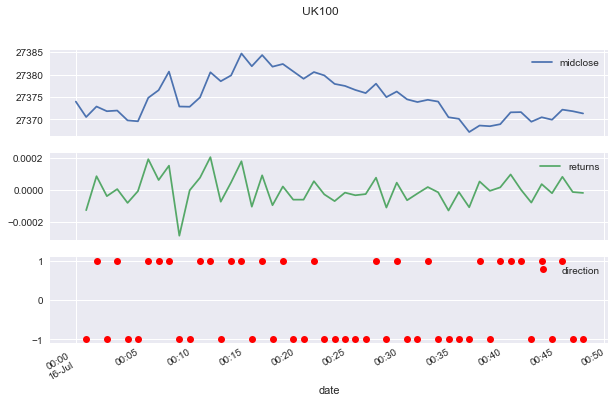

In [21]:
data['direction'] = np.sign(data['returns'])
to_plot = ['midclose', 'returns', 'direction']
data[to_plot].iloc[:50].plot(figsize=(10, 6),
        subplots=True, style=['-', '-', 'ro'], title='UK100');

In [22]:
# the "patterns" = 2 ** lags
np.digitize(data[cols], bins=[0])[:10]

array([[1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1],
       [0, 1, 1, 1, 1, 1],
       [1, 0, 1, 1, 1, 1],
       [0, 1, 0, 1, 1, 1],
       [1, 0, 1, 0, 1, 1],
       [0, 1, 0, 1, 0, 0],
       [0, 0, 1, 0, 1, 0],
       [1, 0, 0, 1, 0, 1],
       [1, 1, 0, 0, 1, 1]])

In [23]:
data.dropna(inplace=True)

In [24]:
from sklearn import svm
model = svm.SVC(C=100)

In [25]:
%time model.fit(np.sign(data[cols]), np.sign(data['returns']))

CPU times: user 675 ms, sys: 30.6 ms, total: 705 ms
Wall time: 708 ms


SVC(C=100, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [26]:
pred = model.predict(np.sign(data[cols]))
pred[:15]

array([ 1., -1., -1., -1., -1., -1., -1., -1., -1.,  1., -1.,  1., -1.,
       -1.,  1.])

In [27]:
data['position'] = pred

In [28]:
data['strategy'] = data['position'] * data['returns']

In [29]:
# unleveraged | no bid-ask spread or transaction costs | only in-sample
data[['returns', 'strategy']].cumsum().apply(np.exp).iplot()

In [30]:
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

In [31]:
mu = data['returns'].mean()
v = data['returns'].std()
bins = [mu - v, mu, mu + v]
train_x, test_x, train_y, test_y = train_test_split(
    data[cols].apply(lambda x: np.digitize(x, bins=bins)),                   
    np.sign(data['returns']),
    test_size=0.4, random_state=1111)

In [32]:
train_x.sort_index(inplace=True)
train_y.sort_index(inplace=True)
test_x.sort_index(inplace=True)
test_y.sort_index(inplace=True)

In [33]:
# the patterns = buckets ** lags
train_x.head(5)

,lag_1,lag_2,lag_3,lag_4,lag_5,momentum
date,,,,,,
2019-07-16 00:06:00,1,2,1,2,1,1
2019-07-16 00:08:00,3,1,1,2,1,2
2019-07-16 00:10:00,3,2,3,1,1,2
2019-07-16 00:12:00,1,0,3,2,3,2
2019-07-16 00:13:00,2,1,0,3,2,2


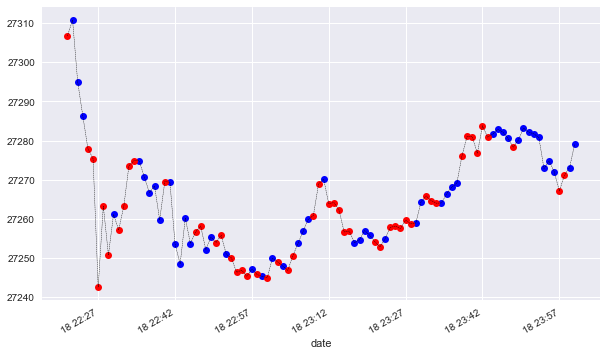

In [34]:
ax = data['midclose'].iloc[-100:][train_x.index].plot(style=['bo'], figsize=(10, 6))
data['midclose'].iloc[-100:][test_x.index].plot(style=['ro'], ax=ax)
data['midclose'].iloc[-100:].plot(ax=ax, lw=0.4, style=['k--']);

In [35]:
model.fit(train_x, train_y)
train_pred = model.predict(train_x)
accuracy_score(train_y, train_pred)

0.656479217603912

In [36]:
test_pred = model.predict(test_x)
accuracy_score(test_y, test_pred)

0.48166259168704156

In [37]:
pred = model.predict(data[cols].apply(
                    lambda x: np.digitize(x, bins=bins)).dropna())
pred[:15]

array([-1.,  1., -1., -1.,  1., -1.,  1.,  1., -1., -1., -1., -1.,  1.,
       -1., -1.])

In [38]:
data['position'] = pred
data['strategy'] = data['position'] * data['returns']
# in-sample | unleveraged | no bid-ask spread or transaction costs
data.loc[train_x.index][['returns', 'strategy']].cumsum().apply(np.exp).iplot()

In [39]:
# out-of-sample | unleveraged | no bid-ask spread or transaction costs
data.loc[test_x.index][['returns', 'strategy']].cumsum().apply(np.exp).iplot()

In [40]:
# number of trades
sum(data['position'].diff() != 0)

1915

In [41]:
con.get_accounts()

,accountId,accountName,balance,dayPL,equity,grossPL,hedging,mc,mcDate,ratePrecision,t,usableMargin,usableMargin3,usableMargin3Perc,usableMarginPerc,usdMr,usdMr3
0,650638,00650638,4804.41,0,4804.41,0,Y,N,,0,6,4804.41,4804.41,100,100,0,0


In [42]:
con.get_open_positions(kind='list')

[]

In [43]:
con.close_all()

In [44]:
con.get_open_positions()

""


In [45]:
con.get_open_positions(kind='list')

[]